# Extremely Noisy 4-D STEM Strain Mapping Using Cycle Consistent Spatial Transforming Autoencoders (Experimental 4dstem)

## Package Installation

In [1]:
import sys
!{sys.executable} -m pip install -i https://test.pypi.org/simple/ Auto4DSTEM==0.7.1

Looking in indexes: https://test.pypi.org/simple/


  Attempting uninstall: Auto4DSTEM
    Found existing installation: Auto4DSTEM 0.2.3
    Uninstalling Auto4DSTEM-0.2.3:
      Successfully uninstalled Auto4DSTEM-0.2.3


## Package Loading

In [2]:
%load_ext autoreload
%autoreload 2
import os
import torch
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from cmcrameri import cm
from auto4dstem.Data.DataProcess import data_translated
from auto4dstem.nn.Train_Function import TrainClass
from auto4dstem.Viz.util import download_files_from_txt, mask_class, upsample_mask, center_of_mass,\
                                translate_base, select_points, generate_classification
from auto4dstem.Viz.viz import set_format_Auto4D, visualize_real_4dstem

In [3]:
torch.__version__

'2.1.0+cu121'

In [4]:
import cv2
cv2.__version__

'4.10.0'

## Device Setting

In [5]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="2"

if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Using GPU")
else:
    device = torch.device('cpu')
    print("Using CPU")

Using GPU


## Visualization Format

In [6]:
set_format = set_format_Auto4D()
pylab.rcParams.update(set_format)

In [7]:
# ignore warning scripts
warnings.filterwarnings('ignore') 

## Download Data and Pre-Trained Models

In [8]:
folder_name = 'Extremely_Noisy_4DSTEM_Strain_Mapping_Using_CC_ST_AE_Experimental'
file_download =  "Experimental_label_weights_affine_para"

In [9]:
download_files_from_txt(file_download,folder_name)

FileNotFoundError: [Errno 2] No such file or directory: 'Experimental_label_weights_affine_para'

## Visualize results in notebook

In [12]:
img_show = True
if img_show:
    %matplotlib inline
else:
    plt.ioff()

# $WS_2WSe_2$ 4-D STEM

## Build mask for training and generating results

### Build Mask

In [54]:
# set mask class
set_mask = mask_class(img_size=[120,120])
# generate mask 
mask_tensor, mask_list = set_mask.mask_ring(radius_1=12, radius_2 = 45)

## 1st Training Process 

### Set File Initial, Load Data and Pre-Trained Weights

In [55]:
data_path = os.path.abspath(f'{folder_name}/data_x256_y256_raw.npy')
file_name = 'WS2WSe2'

### Initialize the training class from real dataset

In [56]:
real_tc = TrainClass(data_path,
                 device = device,
                 crop = ((2,122),(2,122)),
                 transpose= (2,3,0,1),
                 background_intensity =  False,
                 standard_scale = 1.0,
                 en_original_step_size = [120, 120],
                 pool_list =  [4, 3, 2],
                 up_list = [2, 3, 4],
                 num_base = 2,
                 up_size = 480,
                 scale_limit = 0.05,
                 shear_limit = 0.1,
                 rotation_limit = 0.1,
                 crop_radius = 36,
                 num_mask = 1,
                 fixed_mask = mask_list,
                 interpolate = False,
                 revise_affine = False,
                 folder_path = folder_name
                 )

## Load pretrained weight to neural network

In [57]:
weight_path = f'{folder_name}/{file_name}_1st_training_weights.pkl'
real_tc.load_pretrained_weight(weight_path)

## Generate and save results

In [58]:
# set batch size and load dataset into DataLoader
real_tc.batch_size = 256
real_tc.predict(train_process='1',
               save_rotation = True,
               save_classification = True,
               file_name=file_name)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 256/256 [01:53<00:00,  2.25it/s]


## Initialize visual result class
### Set hyper parameters of the class

In [59]:
classification_path = f'{folder_name}/{file_name}_1_train_process_classification.npy'
rotation_1st_path = f'{folder_name}/{file_name}_1_train_process_rotation.npy'
classification_1 = np.load(classification_path)

## Show 6 examples of training results (Put this process into Package)

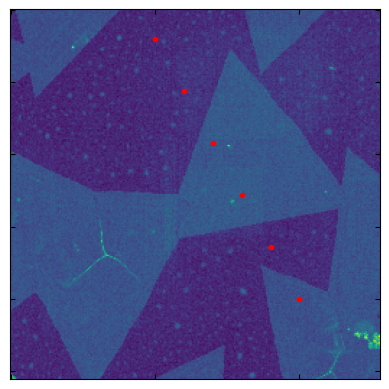

In [60]:
rxs = np.linspace(100,200,6).astype('int')
rys = np.linspace(20,200,6).astype('int')
real_tc.show_pickup_dots(x_axis = rxs,
                         y_axis = rys)

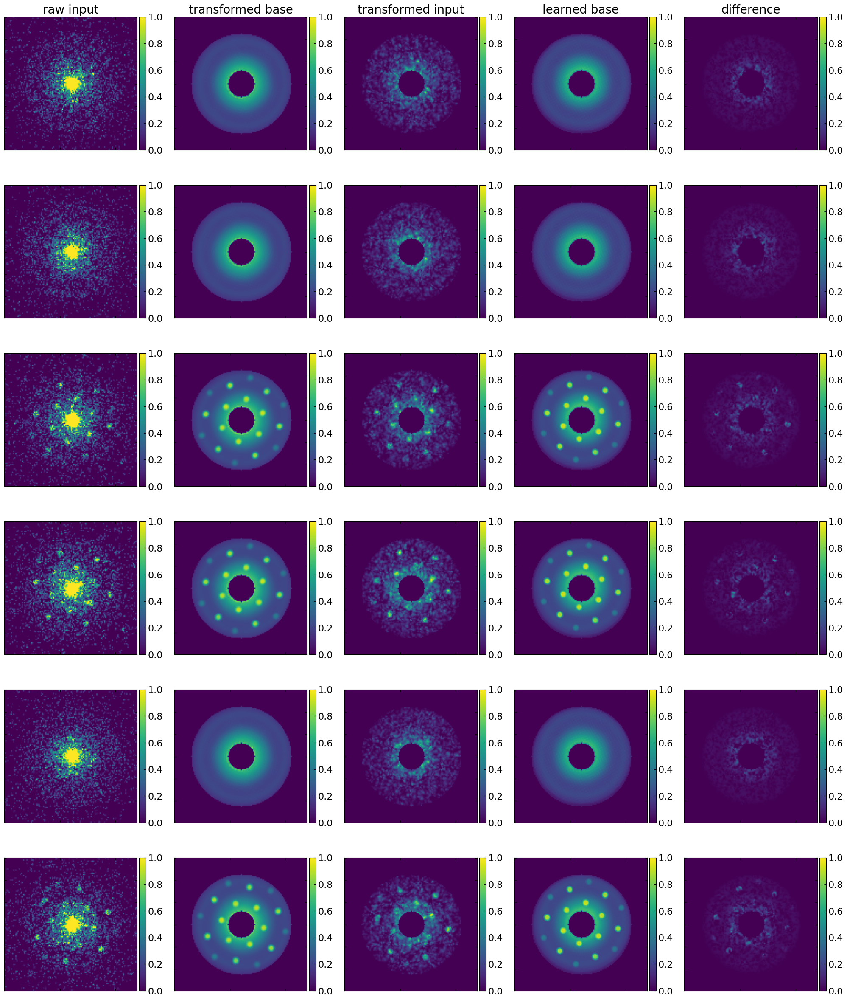

In [61]:
real_tc.show_transforming_sample(mask = mask_tensor,
                                file_name = file_name,
                                )

# 2nd Training Process

### Update train class parameter for data generating

In [62]:
# update number of base and interpolate for 2nd training process
real_tc.learned_rotation = rotation_1st_path
real_tc.adjust_learned_rotation = -10
real_tc.num_base = 1
real_tc.interpolate = True

### Generate dataset

In [63]:
real_tc.reset_dataset()

add image-rotation pair to whole dataset


100%|████████████████████████████████████████████████████████████████████████████████████████| 65536/65536 [00:00<00:00, 1669599.83it/s]


## Select diffraction image

In [64]:
sample_index = np.where(classification_1[:,0]==1)[0]

## Load pretrained weight to neural network

In [65]:
# update weights to reproduce 2nd training results
weight_path = f'{folder_name}/{file_name}_2nd_training_weights.pkl'
real_tc.load_pretrained_weight(weight_path)

## Generate and save results

In [66]:
real_tc.predict(train_process='2',
           save_strain = True,
           save_rotation = True,
           file_name=file_name,
           sample_index = sample_index)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 123/123 [01:13<00:00,  1.67it/s]


## Save trained affine parameter

## Visualize the results and compared with state-of-art

In [67]:
rotation_2nd_path = f'{folder_name}/{file_name}_2_train_process_rotation.npy'
strain_2nd_path = f'{folder_name}/{file_name}_2_train_process_scale_shear.npy'
rotation_2= np.load(rotation_2nd_path)
scale_shear_2 = np.load(strain_2nd_path)

## Visualization  for real dataset ( only with real data )

100%|██████████████████████████████████████████████████████████████████████████████████████████| 31351/31351 [00:00<00:00, 58292.31it/s]


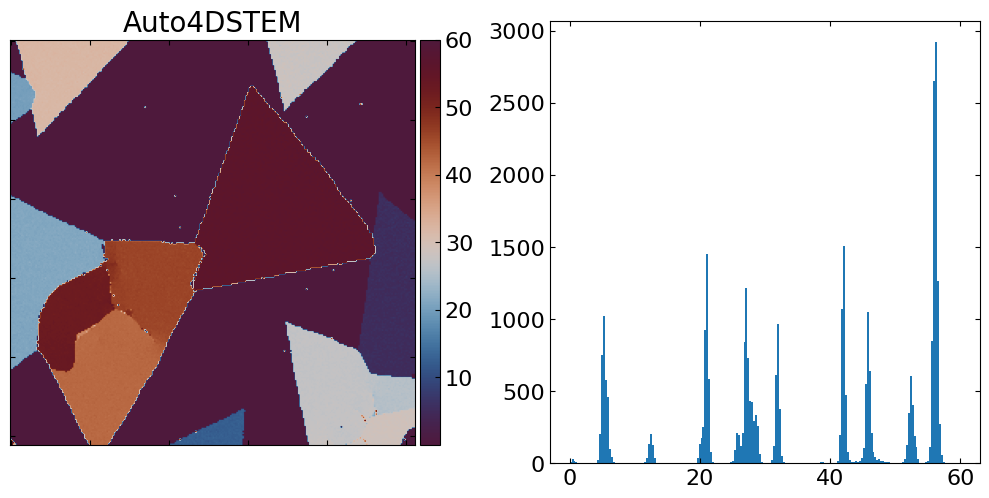

In [68]:
visual_result = visualize_real_4dstem(rotation = rotation_2,
                                       scale_shear = scale_shear_2,
                                       angle_shift = 6,
                                       shift_ref = 0,
                                       im_size = (256,256),
                                       bkg_position = 1,
                                       classification = classification_1,
                                       title_name = 'WS2WSe2',
                                       cmap_strain='viridis',
                                       cmap_rotation=cm.vikO,
                                       rotation_range = [0.01,60],
                                        )

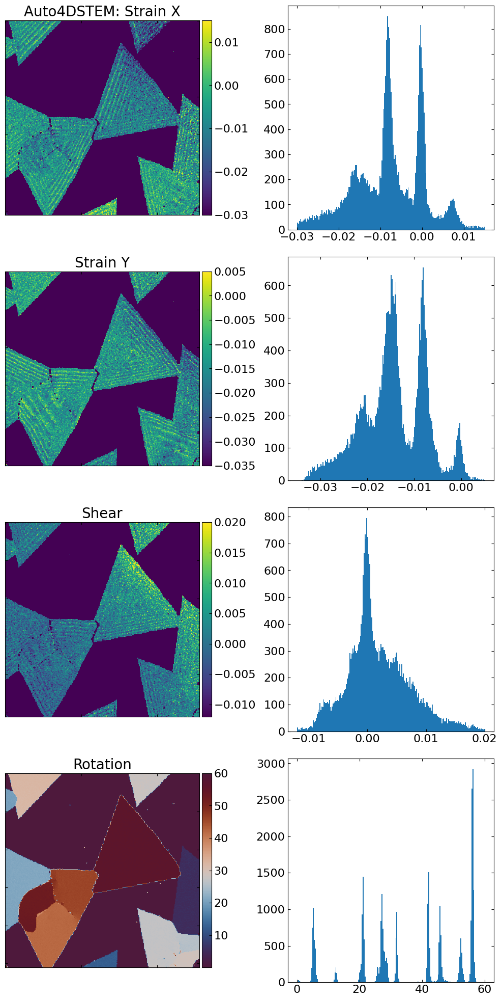

In [69]:
visual_result.visual_real_strain()

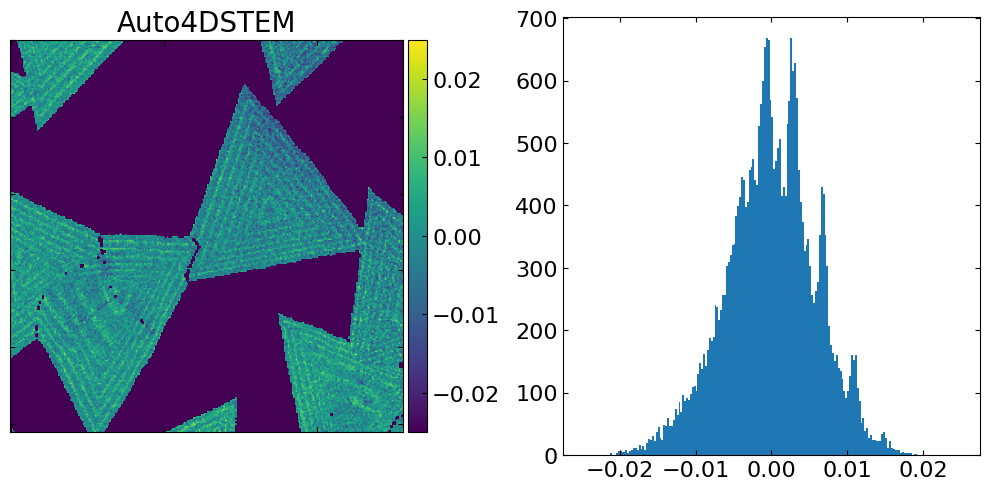

In [70]:
visual_result.visual_magnitude_of_strain(strain_range=[-0.025,0.025])

## Visualize for real dataset ( with py4dstem )

In [71]:
path_py4DSTEM = f'{folder_name}/analysis_exp_2D__strain_ws2wse2.h5'
visual_result.file_py4DSTEM = path_py4DSTEM

In [72]:
visual_result.reset_baseline()

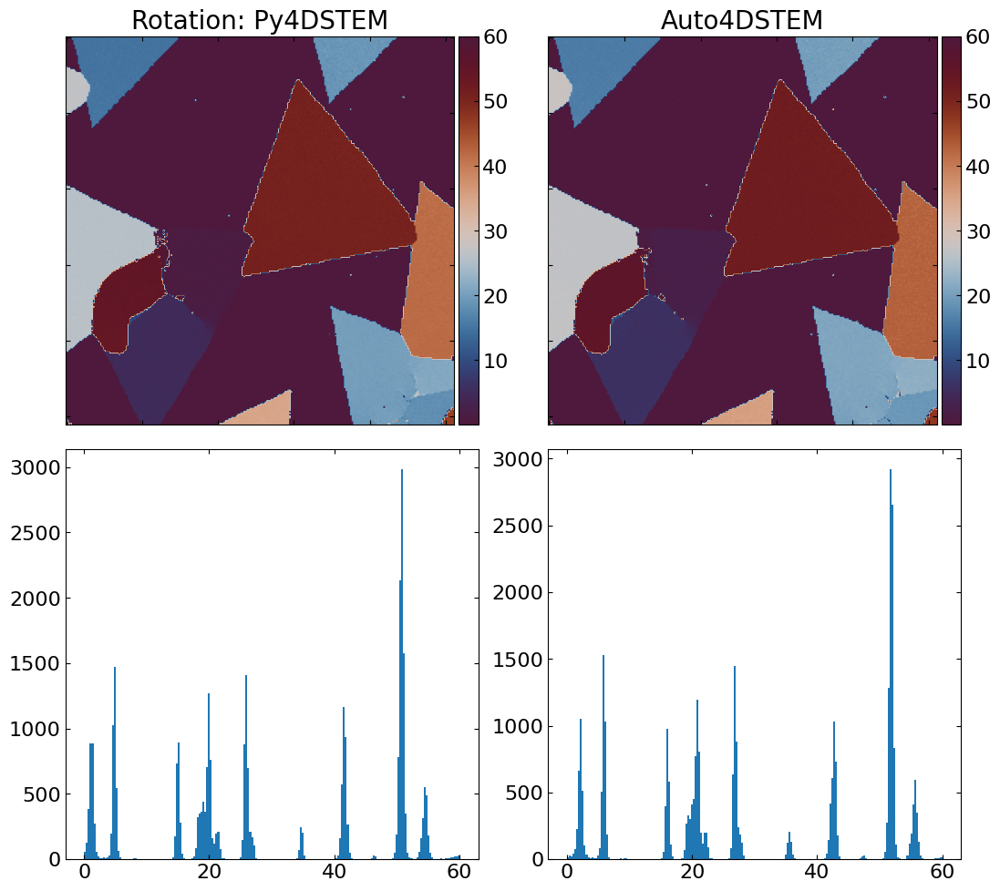

In [73]:
visual_result.reset_angle(angle_shift=42,
                         supplementary_angle= True)

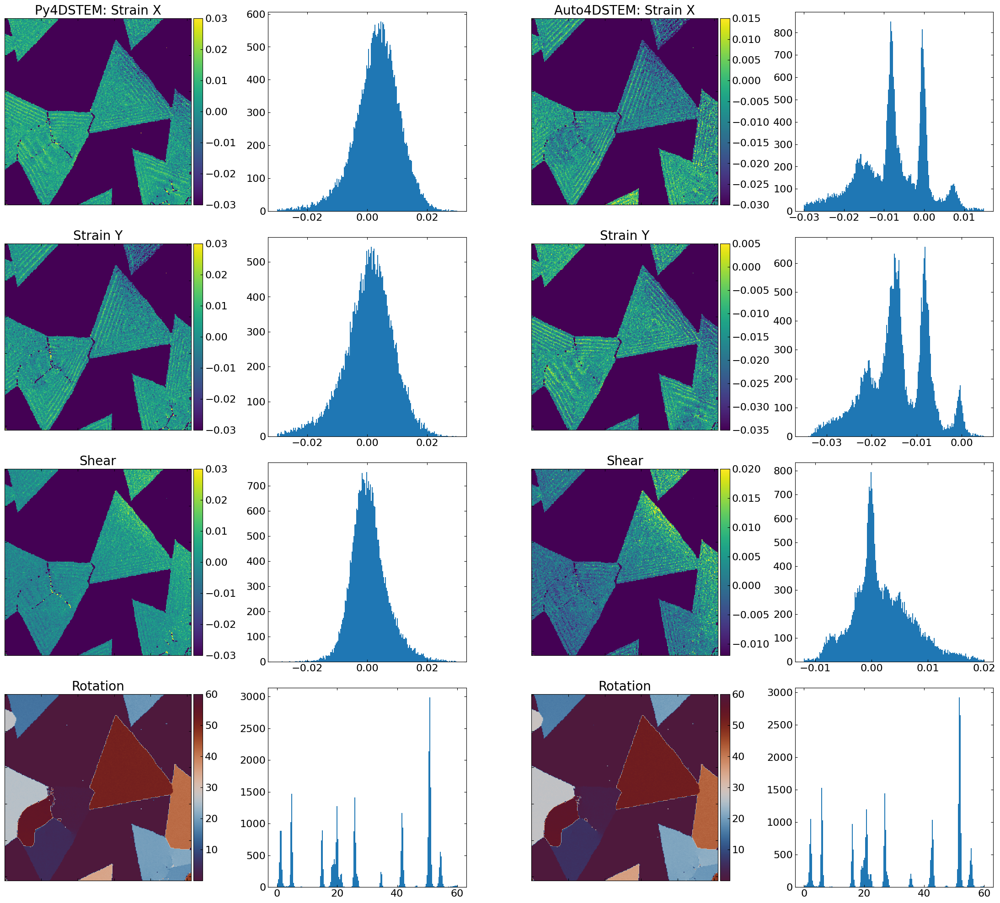

In [74]:
visual_result.visual_strain(strain_range_xx_cross=[-0.03,0.03],
                            strain_range_yy_cross=[-0.03,0.03],
                            strain_range_xy_cross=[-0.03,0.03])

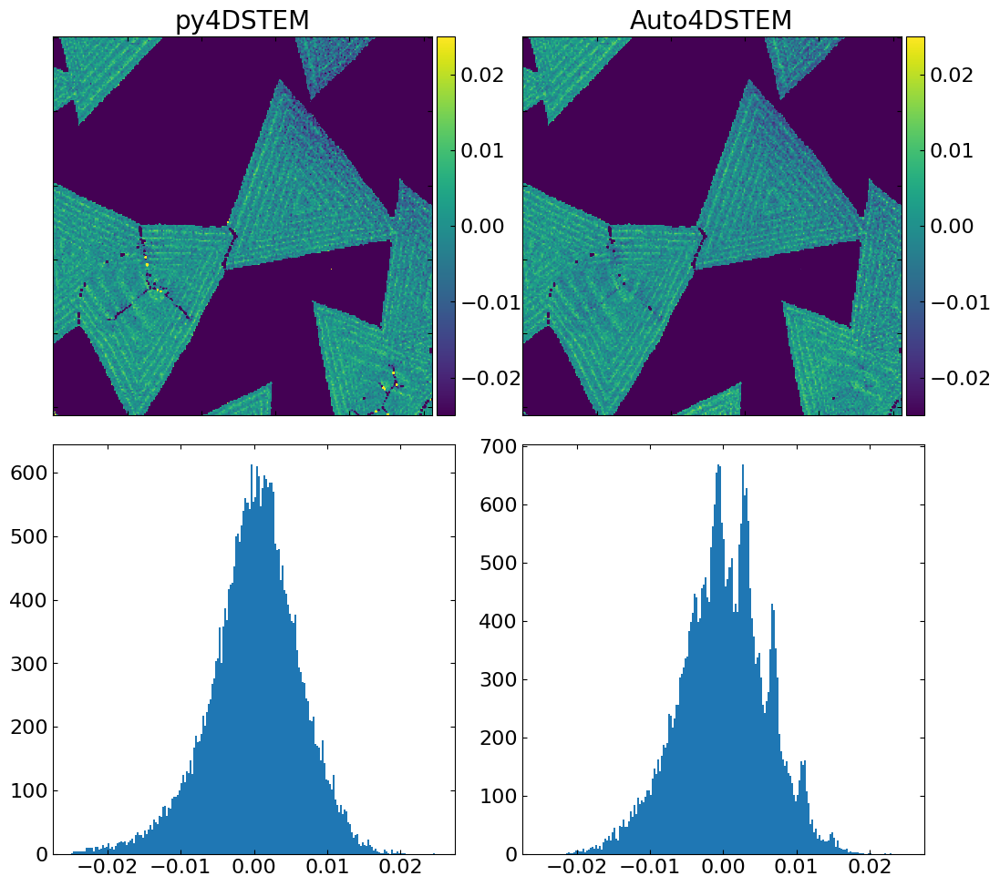

In [75]:
visual_result.visual_magnitude_of_strain(strain_range = [-0.025,0.025],
                                           ref_range = [-0.025,0.025])

# Visualize FGPA results

In [32]:
load_real = np.load('distilled_real.npy')
rotation_real, scale_real = load_real[:, 0:2], load_real[:, 2:]

In [33]:
visual_result.rotation = rotation_real
visual_result.scale_shear = scale_real
visual_result.title_name = 'WS2WSe2_FPGA'

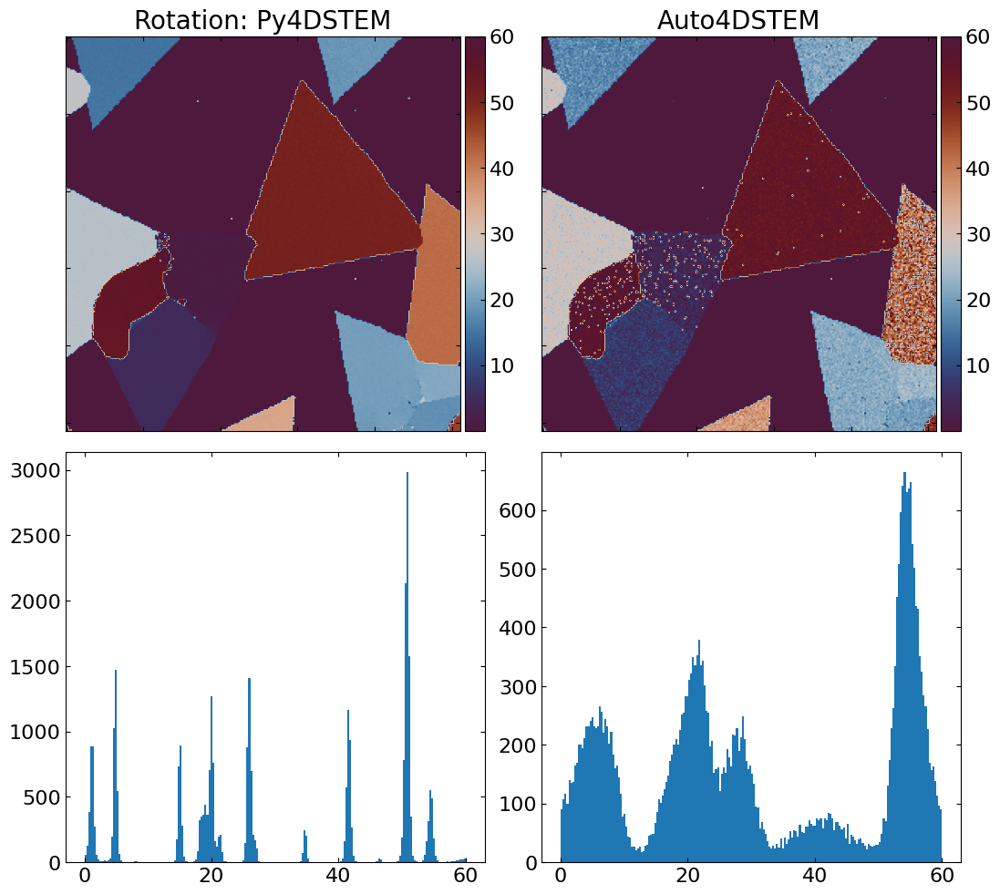

In [34]:
visual_result.reset_angle(angle_shift=42,
                         supplementary_angle= True)

In [35]:
visual_result.reset_polar_matrix()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 31351/31351 [00:00<00:00, 41318.62it/s]


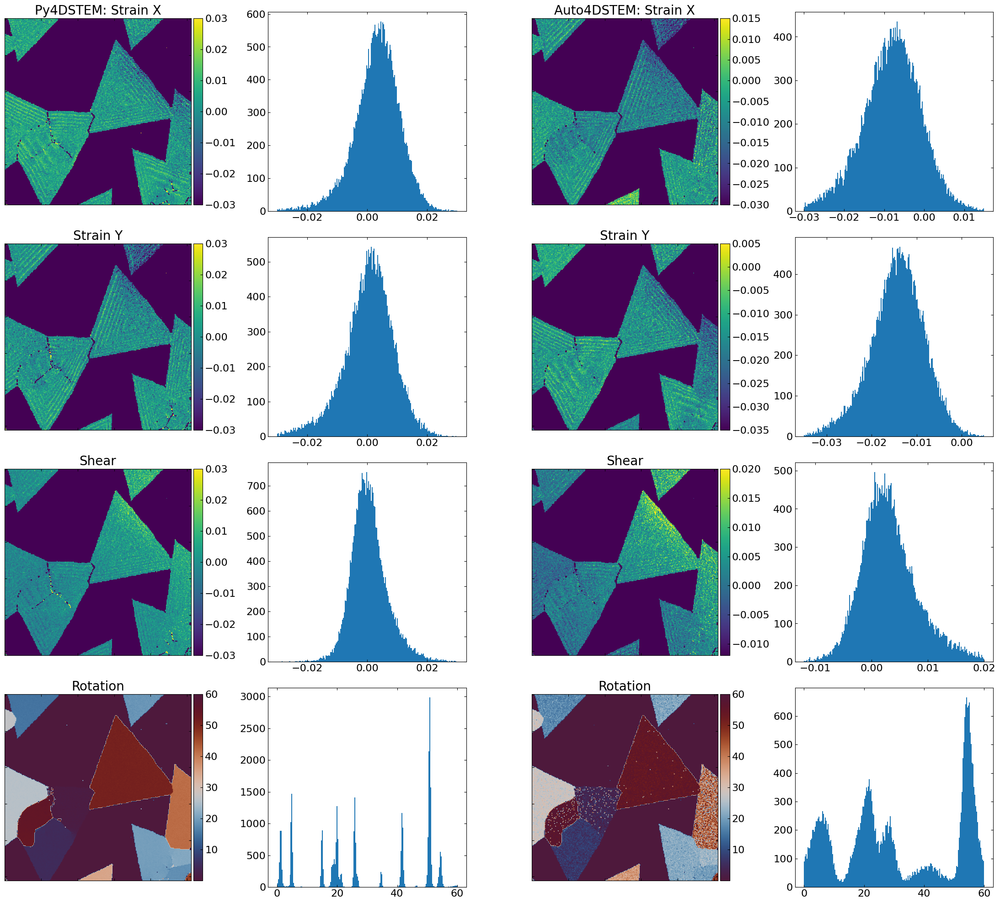

In [39]:
visual_result.visual_strain(strain_range_xx_cross=[-0.03,0.03],
                            strain_range_yy_cross=[-0.03,0.03],
                            strain_range_xy_cross=[-0.03,0.03])

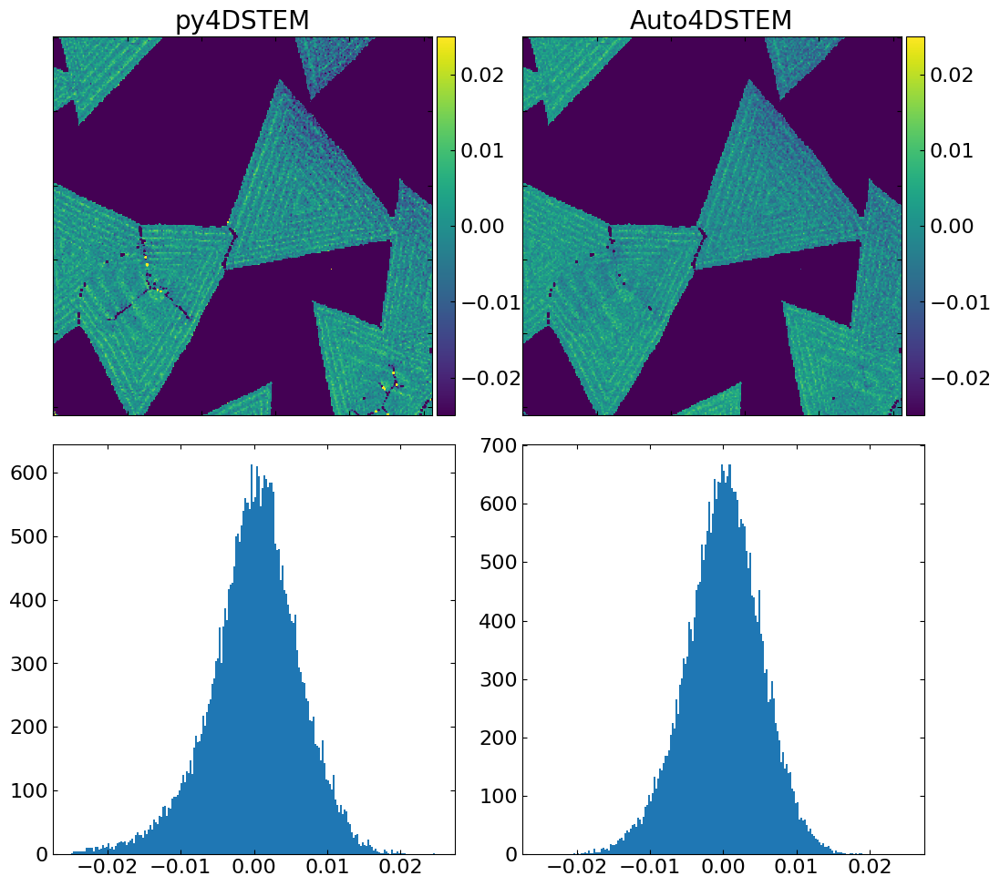

In [38]:
visual_result.visual_magnitude_of_strain(strain_range = [-0.025,0.025],
                                           ref_range = [-0.025,0.025])

# Rot512 $WS_2WSe_2$ Experimental 4DSTEM
## 1st Training Process ( make beam centered)

### Build mask list for training

In [14]:
# set mask class
set_mask = mask_class(img_size=[120,120])
# generate mask 
mask_tensor, mask_list = set_mask.mask_single(radius=15)
up_mask_list = upsample_mask(mask_list,120,480)

## Set File Initial, Load Data and Pre-Trained Weights

In [15]:
data_path = os.path.abspath(f'{folder_name}/01_22kx_CL1p5m_50umapt_spot9_rot15_x512_y512.npy')
file_name = 'Rot512'

In [16]:
real_tc = TrainClass(data_path,
                 device = device,
                 crop = ((2,122),(2,122)),
                 transpose= (0,1,2,3),
                 background_intensity = False,
                 boundary_filter = True,
                 en_original_step_size = [120, 120],
                 de_original_step_size = [5, 5],
                 pool_list = [4, 3, 2],
                 up_list = [2, 3, 4],
                 scale = False,
                 shear = False,
                 rotation = False,
                 translation = True,
                 num_base=1,
                 up_size=480,
                 scale_limit = 0.05,
                 shear_limit = 0.1,
                 rotation_limit=0.05,
                 trans_limit = 0.15,
                 crop_radius = 32,
                 num_mask = 1,
                 fixed_mask = mask_list,
                 interpolate = True,
                 revise_affine = False,
                 folder_path = folder_name
                 )

add sobel filter to whole dataset


100%|█████████████████████████████████████████████████████████████████████████████████████████| 262144/262144 [01:19<00:00, 3281.99it/s]


### Reproduce translation matrices

In [17]:
weight_path = f'{folder_name}/{file_name}_1st_training_translation_weights.pkl'
real_tc.load_pretrained_weight(weight_path)

## Generate and save results

In [18]:
# set batch size and load dataset into DataLoader
real_tc.batch_size = 256
real_tc.predict(train_process='1',
               save_translation = True,
               save_base= True,
               file_name=file_name
               )

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [10:04<00:00,  1.69it/s]


### Show translation result

In [19]:
translation_path = f'{folder_name}/{file_name}_1_train_process_translation.npy'
base_path = f'{folder_name}/{file_name}_1_train_process_generated_base.npy'
translation = np.load(translation_path)
test_base = np.load(base_path)

## Make generated base at the center 

In [20]:
test_base = torch.tensor(test_base.squeeze())
print(center_of_mass(test_base,up_mask_list[0],0))

(tensor(252.9097), tensor(226.2922))


## Adjust x, y coordinates to make beam centered

In [21]:
adj_x = -0.060434
adj_y = 0.056313
translate_base(adj_x,adj_y,torch.tensor(test_base), up_mask_list[0])

(tensor(240.0001), tensor(240.0001))

## Create modified translation parameter

In [22]:
# create translated matrix
trans_after_adjust = np.copy(translation)
trans_after_adjust[:,0] = trans_after_adjust[:,0]+adj_x
trans_after_adjust[:,1] = trans_after_adjust[:,1]+adj_y

## Generate translated dataset 

In [49]:
# if create_dataset is set True, will reproduce the translated 4dstem dataset, takes about 4 hours
create_dataset = False
if create_dataset:
    data_translated(data_path,
                    trans_after_adjust,
                    crop = ((2,122),(2,122)),
                    transpose = (0,1,2,3),
                    save_path = f'{folder_name}/{file_name}')

## Reproduce result of translated model
### Set train class for transformed dataset

In [23]:
data_dir = f'{folder_name}/{file_name}_translated_version.npy'

In [24]:
real_tc.data_dir = data_dir
real_tc.crop = ((0,120),(0,120))
real_tc.transpose = (0,1,2)
real_tc.standard_scale = 1.5
real_tc.up_threshold = 2000
real_tc.rotate_clockwise = False
real_tc.boundary_filter = False
real_tc.scale = True
real_tc.shear = True
real_tc.rotation = True
real_tc.translation = False

In [25]:
real_tc.reset_dataset()

### Set mask to separate diffraction images from background noise 

In [26]:
radius_list = [[23,96],[72,109],[108,73],[95,24],[46,11],[11,47]]
mask_tensor, mask_list = set_mask.mask_round(radius=8,center_list=radius_list)

### Select diffraction image

100%|████████████████████████████████████████████████████████████████████████████████████████| 262144/262144 [00:10<00:00, 26177.52it/s]


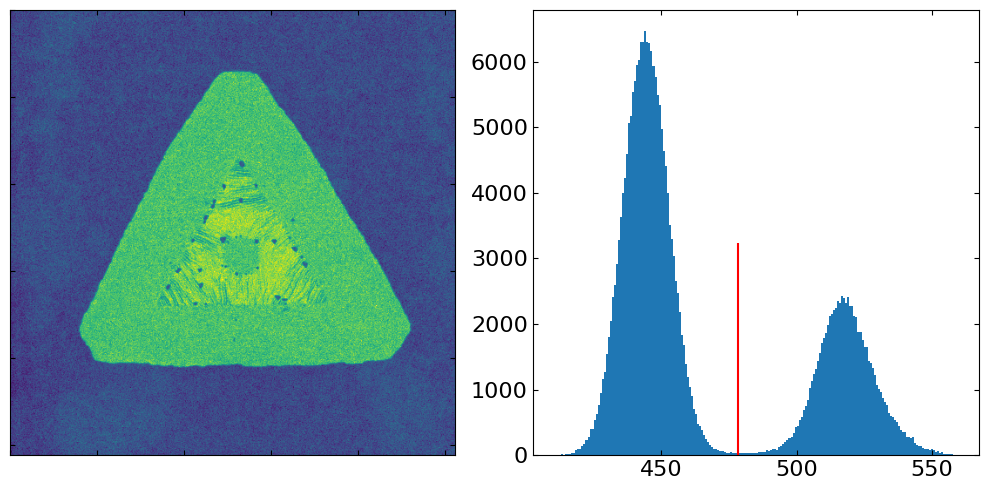

In [27]:
sample_index = select_points(real_tc.data_set,mask_tensor,threshold=478.3,clim=[410,560])

### Reproduce strain-mapping results with pretrained weights

In [28]:
weight_path = f'{folder_name}/{file_name}_1st_training_strain_rotation_weights.pkl'
real_tc.load_pretrained_weight(weight_path)

In [29]:
real_tc.batch_size = 256
real_tc.predict(sample_index = sample_index,
               train_process='1',
               save_rotation = True,
               save_strain = True,
               file_name=file_name,
               )

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 315/315 [03:06<00:00,  1.69it/s]


## Generate correct format of classification 

In [30]:
select_rot = generate_classification(sample_index,
                                    sample_position = 0,
                                    img_size = [512,512],
                                    save_file = True,
                                    file_path = f'{folder_name}/{file_name}')

## Visualization  for real dataset ( only with real data )

In [31]:
rotation_2nd = np.load(f'{folder_name}/{file_name}_1_train_process_rotation.npy')
scale_shear_2nd = np.load(f'{folder_name}/{file_name}_1_train_process_scale_shear.npy')
select_rot = np.load(f'{folder_name}/{file_name}_classification.npy')

100%|██████████████████████████████████████████████████████████████████████████████████████████| 80499/80499 [00:01<00:00, 53645.13it/s]


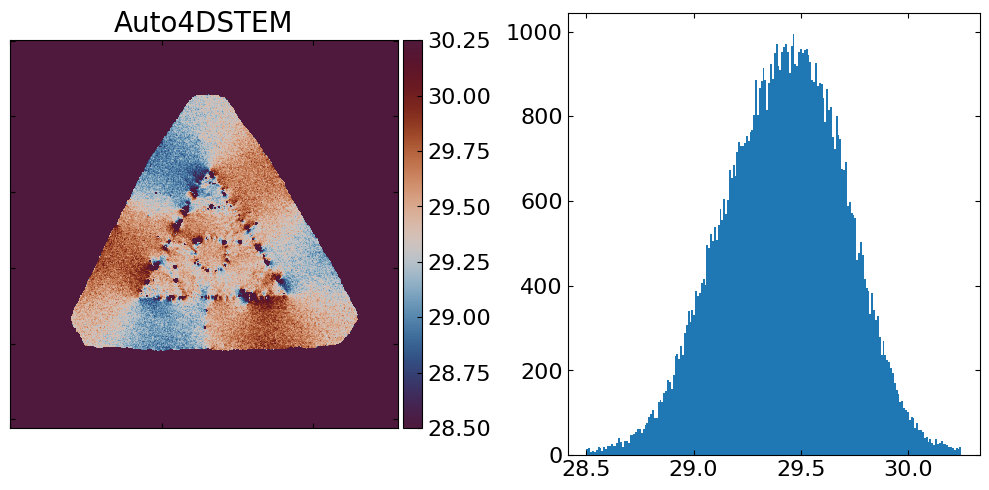

In [32]:
visual_result = visualize_real_4dstem(rotation = rotation_2nd,
                                           scale_shear = scale_shear_2nd,
                                           angle_shift = 30,
                                           shift_ref = 33,
                                           im_size = (512,512),
                                           bkg_position = 1,
                                           classification = select_rot,
                                           title_name = 'Rot512',
                                           cmap_strain = 'viridis',
                                           cmap_rotation=cm.vikO,
                                           rotation_range = [28.5,30.25],
                                            )

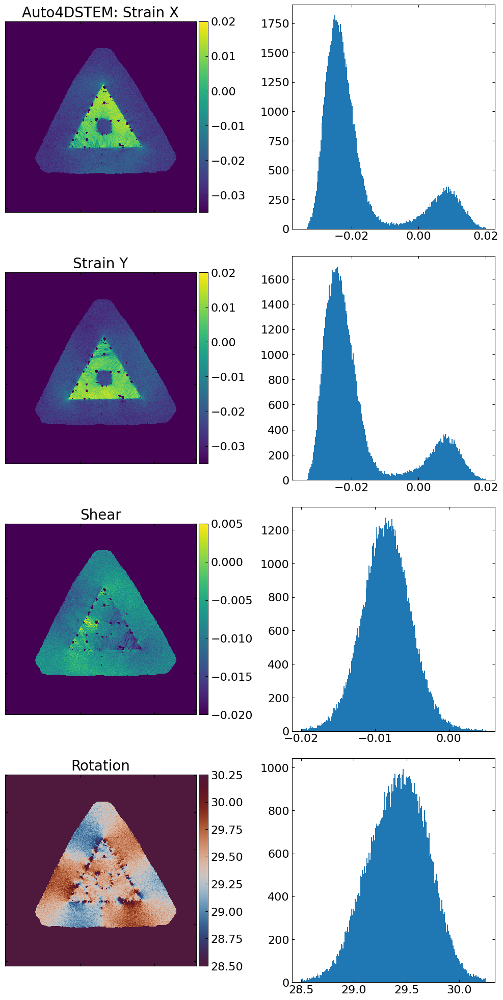

In [33]:
visual_result.visual_real_strain(strain_range_xx_ae=[-0.035,0.02],
                                 strain_range_yy_ae=[-0.035,0.02],
                                 strain_range_xy_ae=[-0.02,0.005],
                                 )

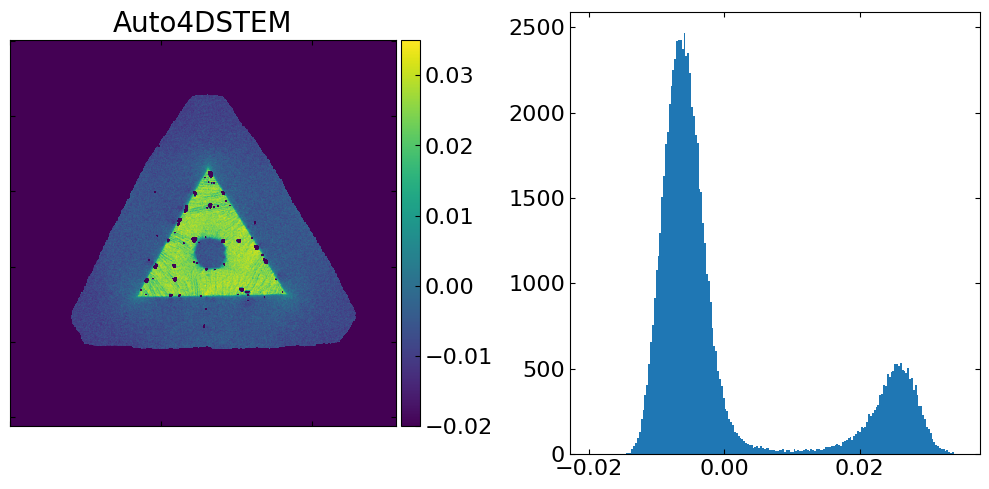

In [34]:
visual_result.visual_magnitude_of_strain(strain_range = [-0.02,0.035])

## Visualization  for result comparison ( with py4DSTEM )

In [35]:
path_py4DSTEM = f'{folder_name}/analysis_exp_2D_big_triangle__strain.h5'
visual_result.file_py4DSTEM = path_py4DSTEM

In [36]:
visual_result.reset_baseline()

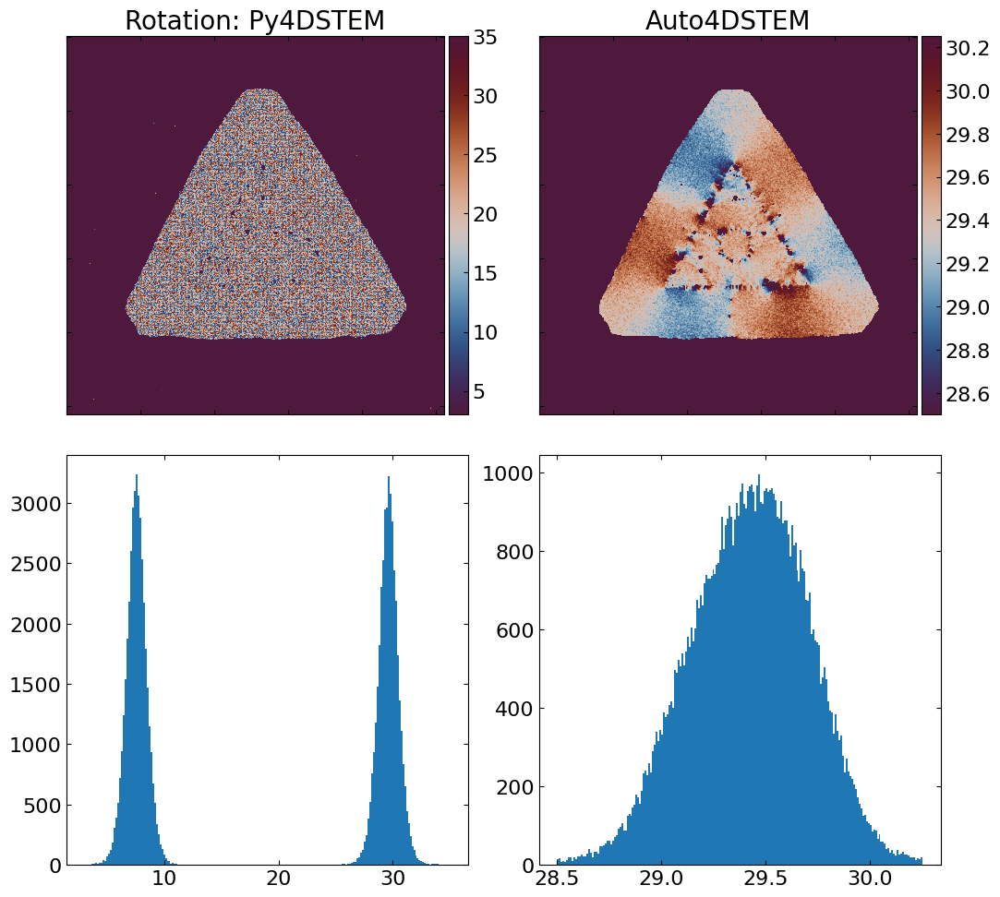

In [37]:
visual_result.reset_angle(angle_shift=30,
                          shift_ref=33,
                          rotation_range=[28.5,30.25],
                          ref_rotation_range=[3,35]
                         )

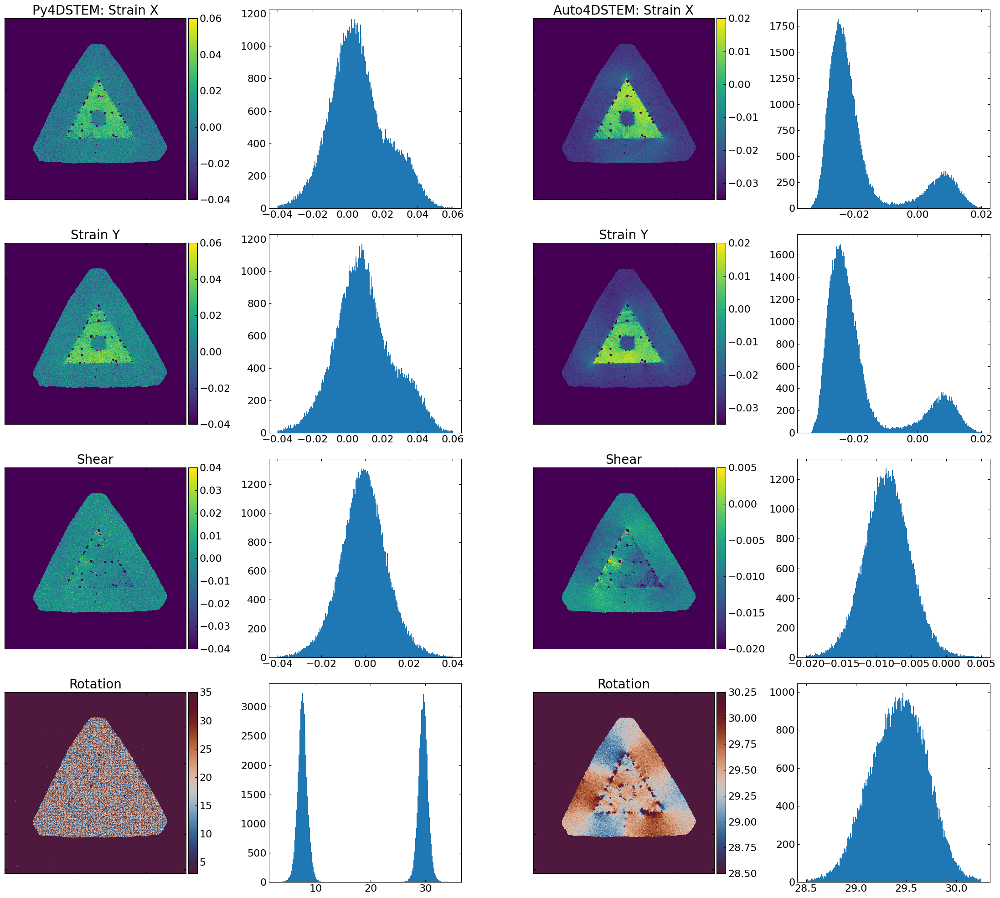

In [38]:
visual_result.visual_strain(strain_range_xx_ae=[-0.035,0.02],
                            strain_range_yy_ae=[-0.035,0.02],
                            strain_range_xy_ae=[-0.02,0.005],
                            strain_range_xx_cross=[-0.04,0.06],
                            strain_range_yy_cross=[-0.04,0.06],
                            strain_range_xy_cross=[-0.04,0.04],
                            )

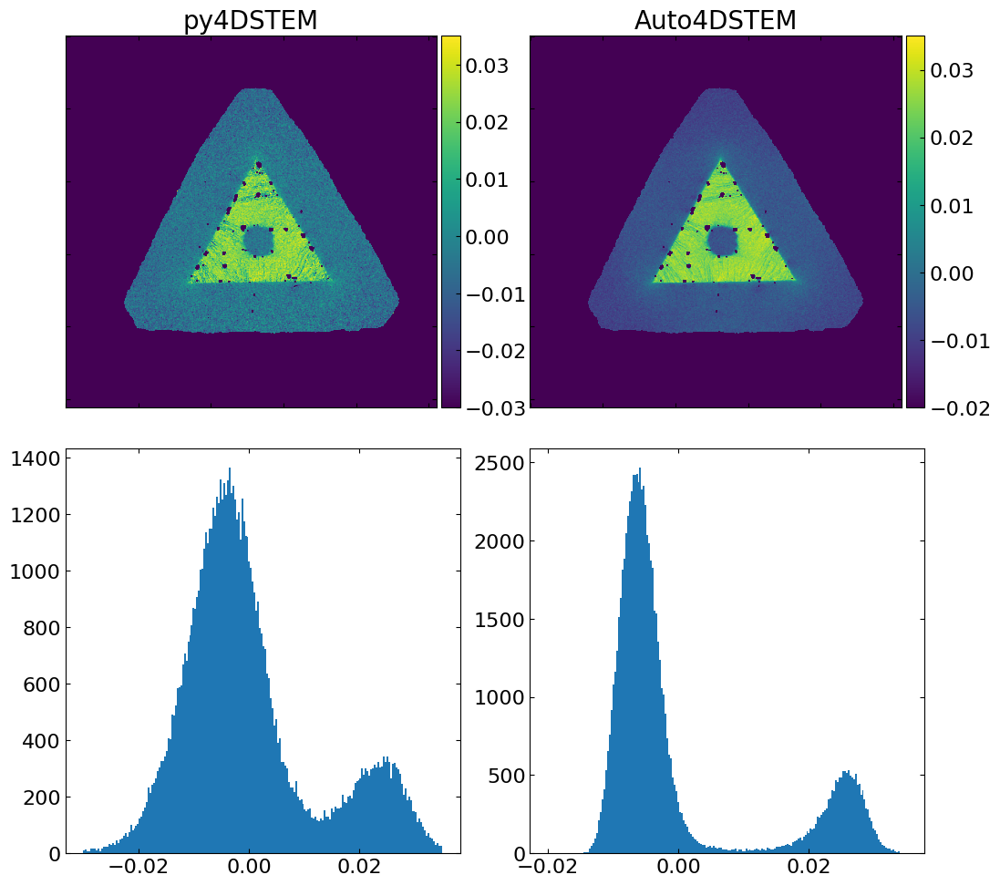

In [39]:
visual_result.visual_magnitude_of_strain(strain_range = [-0.02,0.035],
                                           ref_range = [-0.03,0.035])